In [1]:
import panel as pn
from panel.interact import interact
from panel import widgets
pn.extension('plotly')
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import datetime as dt
import hvplot.pandas
import matplotlib.pyplot as plt
import pandas_datareader.data as web
import seaborn as sns 
import quandl
import numpy as np
import scipy.stats as stats
import matplotlib.ticker as mticker
from mpl_finance import candlestick_ohlc
import matplotlib.dates as mpl_dates
import os
from pathlib import Path
from dotenv import load_dotenv

import warnings
warnings.filterwarnings('ignore')  # ingore warnings

C:\Tapas\Courses\anaconda3\envs\pyvizenv\lib\site-packages\mpl_finance.py:22: DeprecationWarning: 



    Please use `mplfinance` instead (no hyphen, no underscore).

    To install: `pip install --upgrade mplfinance` 

   For more information, see: https://pypi.org/project/mplfinance/


  category=DeprecationWarning)


In [2]:
# ATM Dataset is merged with US state lebel population data. This is done in Postgres SQL. Importing into Pandas DataFrame for further processing
csvpath_atm_pop = Path("Resources/atm_pop.csv")
atm_pop_df = pd.read_csv(csvpath_atm_pop)
atm_pop_df.rename(columns={'state':'State','population':'Population','atm_count':'Bitcoin ATM'},inplace=True)

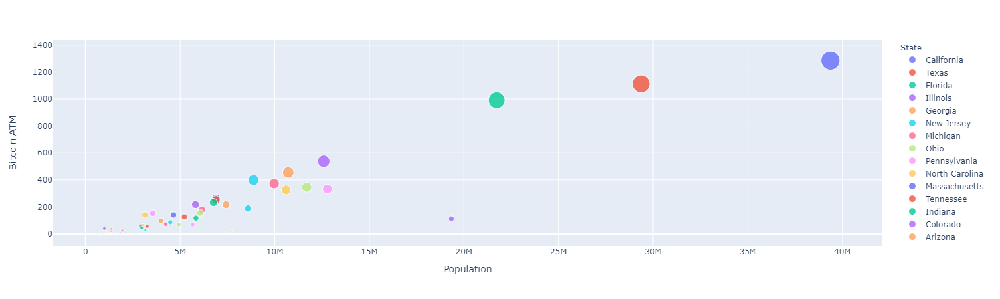

In [3]:
# Linear relationship with population and bitcoin ATMs, NY (4th largest largest state in terms of pop - is the exception
# NY needs special licensing for crypto business and operations in the state - bitlicensing
# That might have negatively infulenced number of ATMs
px.scatter(
    atm_pop_df,
    x="Population",
    y="Bitcoin ATM",
    size="Bitcoin ATM",
    color="State",
    opacity=0.8
)

In [4]:
# States with no bitcoin ATM

ATM_states = list(atm_pop_df['State'])
US_states = ['Alabama','Alaska','Arizona','Arkansas','California','Colorado','Connecticut','Delaware','Florida','Georgia',
            'Hawaii','Idaho','Illinois','Indiana','Iowa','Kansas','Kentucky','Louisiana','Maine','Maryland','Massachusetts',
            'Michigan','Minnesota','Mississippi','Missouri','Montana','Nebraska','Nevada','New Hampshire','New Jersey','New Mexico',
            'New York','North Carolina','North Dakota','Ohio','Oklahoma','Oregon','Pennsylvania','Rhode Island',
            'South Carolina','South Dakota','Tennessee','Texas','Utah','Vermont','Virginia','Washington','West Virginia','Wisconsin',
            'Wyoming']
no_bitcoin_states = list(set(US_states) - set(ATM_states))
NY_atm = atm_pop_df.loc[atm_pop_df['State'] == 'New York']["Bitcoin ATM"].iloc[-1]

In [5]:
# Display few important stat
print(f"Total bitcoin ATMs in the USA     => {atm_pop_df['Bitcoin ATM'].sum()}")
print()
print(f"Average bitcoin ATMs per state    => {atm_pop_df['Bitcoin ATM'].mean():.0f}")
print(f"Bitcoin ATM in NY                 => {NY_atm}")
print()
print(f"Two states don't have Bitcoin ATM => {no_bitcoin_states}")

Total bitcoin ATMs in the USA     => 9527

Average bitcoin ATMs per state    => 198
Bitcoin ATM in NY                 => 113

Two states don't have Bitcoin ATM => ['Vermont', 'Alaska']


In [6]:
# Top 10 states in terms of number of Bitcoin ATMs per million population

atm_pop_df['per_million'] = (atm_pop_df['Bitcoin ATM']/atm_pop_df['Population'])*1000000
top10 = atm_pop_df.nlargest(10,'per_million')

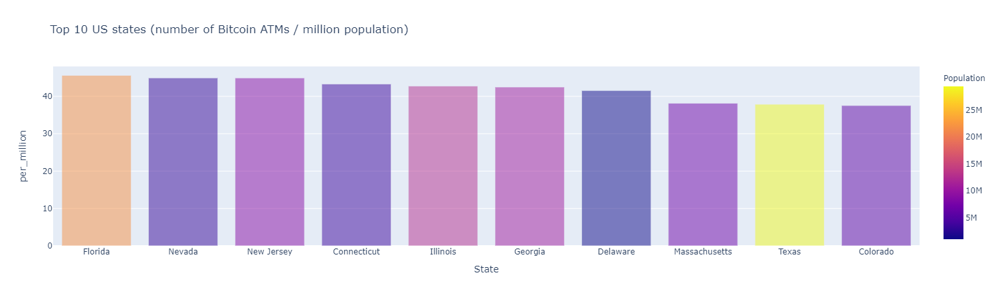

In [7]:
# Display top 10 states 

px.bar(
        top10,
        x="State",
        y="per_million",
        color = "Population",
        color_discrete_sequence=px.colors.qualitative.Antique,
        opacity = 0.5,
        title="Top 10 US states (number of Bitcoin ATMs / million population)"
    )

In [8]:
# After ATM data analysis in junction with population, let's visualize ATMs in US map using mapbox API. ATM data is already 
# pre-processed in postgres SQL

csvpath_city_atm = Path("Resources/city_atm.csv")
city_atm_df = pd.read_csv(csvpath_city_atm)
city_atm_df.head()

,city,lat,lon,atm
0,Houston,45.583290,-80.209415,222
1,Chicago,42.027845,-87.560258,150
2,Los Angeles,34.368041,-117.824839,141
3,Miami,26.647022,-80.126415,112
4,Las Vegas,36.297284,-115.053225,110


In [9]:
# Read the Mapbox API key
load_dotenv()
map_box_api = os.getenv("MAPBOX_API_KEY")
px.set_mapbox_access_token(map_box_api)

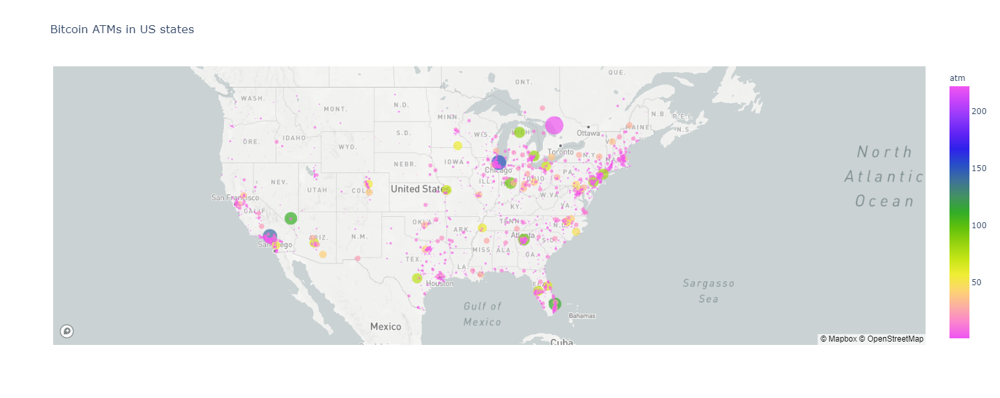

In [10]:
# Display ATM data in US map

px.scatter_mapbox(
        city_atm_df,
        lat="lat",
        lon="lon",
        size='atm',
        color='atm',
        color_continuous_scale=px.colors.cyclical.mygbm,
        hover_name='city',
        hover_data=['atm'],
        title="Bitcoin ATMs in US states",
        zoom=3,
        width=1000,
        height = 600
    )

In [11]:
# Source of crypto,csv is https://nomics.com/ -> Market Data -> Download CSV

csvpath_crypto = Path("Resources/crypto.csv")
crypto_df = pd.read_csv(csvpath_crypto)
crypto_df = crypto_df[['symbol','name','circulating_supply','market_cap','market_cap_dominance']]
total_mcap_trillion = (crypto_df['market_cap'].sum())/1000000000000
 

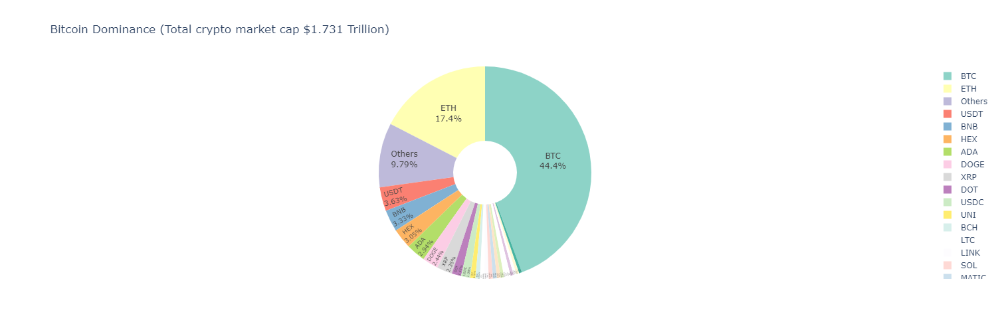

In [12]:
# Display BTC market share

df = px.data.tips()
fig = px.pie(
        crypto_df,
        values='market_cap',
        names='symbol',
        title=f'Bitcoin Dominance (Total crypto market cap ${total_mcap_trillion:.3f} Trillion)',
        color_discrete_sequence=px.colors.qualitative.Set3,
        hole = 0.3,
        width=600,
        height=500
    )
fig.update_traces(textposition='inside', textinfo='percent+label')

In [13]:
# Set timeframe for crypto data download from Yahoo Finance

start = pd.Timestamp("2014-09-16", tz="America/New_York").isoformat()
end = pd.Timestamp(pd.datetime.now(), tz="America/New_York").isoformat()

In [15]:
btc = web.DataReader("BTC-USD", 'yahoo', start, end) 

In [16]:
btc.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2014-09-16,468.174011,452.421997,465.864014,457.334015,21056800.0,457.334015
2014-09-17,456.859985,413.104004,456.859985,424.440002,34483200.0,424.440002
2014-09-18,427.834991,384.532013,424.102997,394.795990,37919700.0,394.795990
2014-09-19,423.295990,389.882996,394.673004,408.903992,36863600.0,408.903992
2014-09-20,412.425995,393.181000,408.084991,398.821014,26580100.0,398.821014


In [17]:
# Data preparation for Candle chart
startdate = pd.to_datetime("2021-01-01").date()
enddate = pd.to_datetime("2021-06-14").date()
btc_candle = btc.loc[startdate:enddate][['Open','High','Low','Close']]

In [18]:
btc_candle.reset_index(inplace=True)
btc_candle['Date'] = pd.to_datetime(btc_candle['Date'])
btc_candle['Date'] = btc_candle['Date'].apply(mpl_dates.date2num)
btc_candle = btc_candle.astype(float)

AttributeError: 'Figure' object has no attribute 'autofmt_xdate'

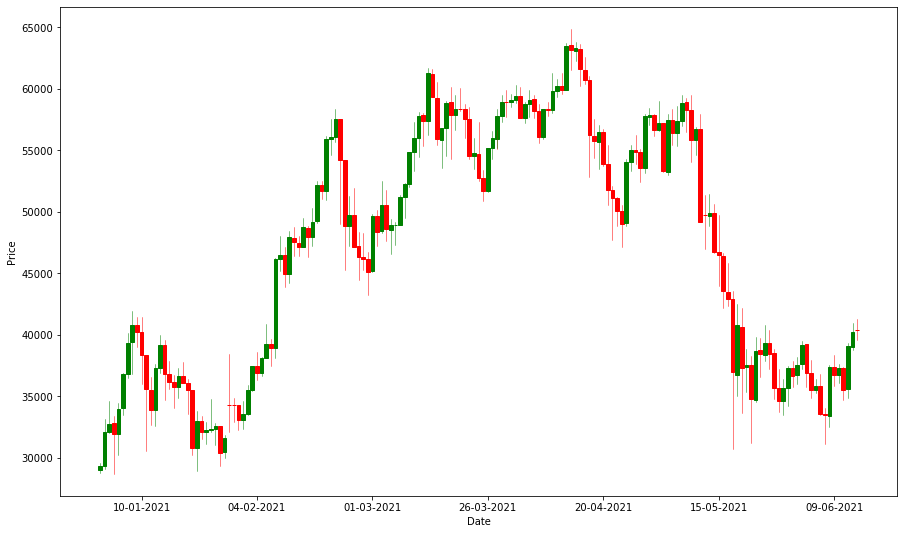

In [19]:
# Display Candle chart for 2021

figure, ax = plt.subplots(figsize = (15,9))
candlestick_ohlc(ax, btc_candle.values, width=0.8,colorup='green',colordown='red')

ax.set_xlabel('Date')
ax.set_ylabel('Price')
#fig.sbptitle('Daily Candlestick Chart of Bitcoin')

# Formatting Date
date_format = mpl_dates.DateFormatter('%d-%m-%Y')
ax.xaxis.set_major_formatter(date_format)
fig.autofmt_xdate()

fig.tight_layout()

plt.show()

In [20]:
ohlc = btc.loc['2014-01-01':'2021-06-14'][['Open','High','Low','Close']]
ohlc.reset_index(inplace=True)
ohlc.head()

,Date,Open,High,Low,Close
0,2014-09-16,465.864014,468.174011,452.421997,457.334015
1,2014-09-17,456.859985,456.859985,413.104004,424.440002
2,2014-09-18,424.102997,427.834991,384.532013,394.795990
3,2014-09-19,394.673004,423.295990,389.882996,408.903992
4,2014-09-20,408.084991,412.425995,393.181000,398.821014


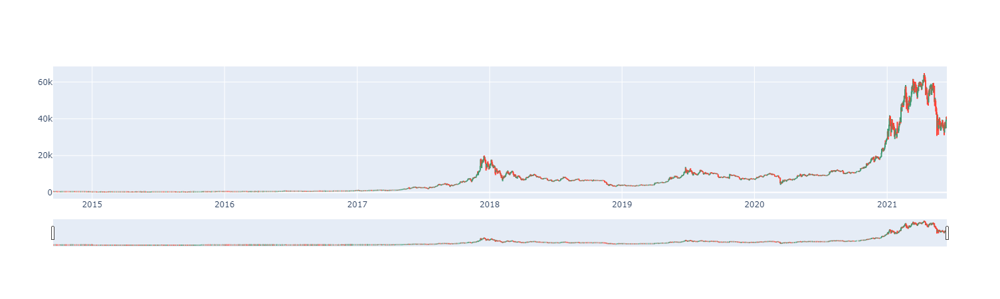

In [21]:
fig = go.Figure(data=go.Ohlc(x=ohlc['Date'],
                    open=ohlc['Open'],
                    high=ohlc['High'],
                    low=ohlc['Low'],
                    close=ohlc['Close']))
fig.show()

In [22]:
# Rename 'Adj Close' to 'BTC'
btc = btc[['Adj Close']]
btc = btc.rename(columns = {'Adj Close':'BTC'})

btc.index = btc.index.date
btc.isnull().sum()

BTC    0
dtype: int64

In [23]:
# Drop duplicate records

btc.drop_duplicates(inplace=True)

In [24]:
btc.head()

,BTC
2014-09-16,457.334015
2014-09-17,424.440002
2014-09-18,394.795990
2014-09-19,408.903992
2014-09-20,398.821014


In [25]:
# Get SP500 daily close data from Yahoo Finance. '^GSPC' is the ticker for SP500.

sp500 = web.DataReader('^GSPC', 'yahoo', start, end) 

In [26]:
sp500.isnull().sum()

High         0
Low          0
Open         0
Close        0
Volume       0
Adj Close    0
dtype: int64

In [27]:
# Drop duplicate records

sp500.drop_duplicates(inplace=True)
sp500 = sp500[['Adj Close']]

sp500 = sp500.rename(columns = {'Adj Close':'SP500'})

In [28]:
sp500.head()

,SP500
Date,
2014-09-16,1998.979980
2014-09-17,2001.569946
2014-09-18,2011.359985
2014-09-19,2010.400024
2014-09-22,1994.290039


In [29]:
# Join Bitcoina and SP500 data

btc_sp500 = pd.concat([btc,sp500],axis=1,join="inner")
btc_sp500.head()

,BTC,SP500
2014-09-16,457.334015,1998.979980
2014-09-17,424.440002,2001.569946
2014-09-18,394.795990,2011.359985
2014-09-19,408.903992,2010.400024
2014-09-22,435.790985,1994.290039


In [30]:
btc.head()

,BTC
2014-09-16,457.334015
2014-09-17,424.440002
2014-09-18,394.795990
2014-09-19,408.903992
2014-09-20,398.821014


In [31]:
# Calculate moving averages for Bitcoin

btc_ma = btc
btc_ma['7MA'] = btc_ma.BTC.rolling(7).mean()
btc_ma['20MA'] = btc_ma.BTC.rolling(20).mean()
btc_ma['50MA'] = btc_ma.BTC.rolling(50).mean()
btc_ma['200MA'] = btc_ma.BTC.rolling(200).mean()

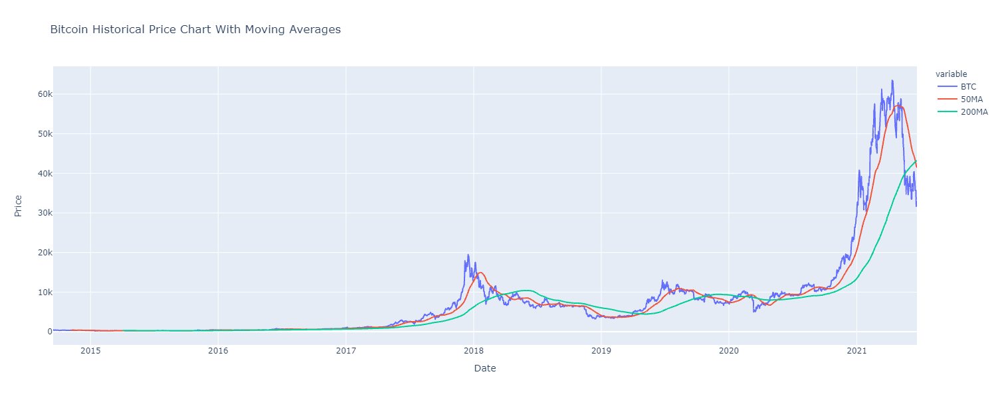

In [32]:
# Plot moving averages - MA50 is close to cross MA200.
px.line(
        btc_ma,
        y=['BTC','50MA','200MA'],
        height = 600,
        width = 970,
        labels ={'value':'Price',
                'index':'Date'},
        title = "Bitcoin Historical Price Chart With Moving Averages"
    )

In [33]:
tsla = web.DataReader('TSLA', 'yahoo', start, end)
tsla = tsla.drop_duplicates()
tsla.rename(columns={'Adj Close':'TSLA'},inplace=True)
tsla.drop(columns=['High','Low','Open','Close','Volume'],inplace=True)

In [34]:
btc_sp500_tsla = pd.concat([btc_sp500,tsla],axis='columns',join='inner')
btc_sp500_tsla.head()

,BTC,SP500,TSLA
2014-09-16,457.334015,1998.979980,52.147999
2014-09-17,424.440002,2001.569946,52.276001
2014-09-18,394.795990,2011.359985,52.764000
2014-09-19,408.903992,2010.400024,51.863998
2014-09-22,435.790985,1994.290039,50.006001


In [35]:
btc_daily_returns = btc_sp500_tsla.pct_change()
btc_daily_returns_slice = btc_daily_returns.loc['2021-01-01':'2021-06-17']
btc_cov_wrt_sp500 = btc_daily_returns_slice['BTC'].cov(btc_daily_returns_slice['SP500'])
btc_var_sp500 = btc_daily_returns_slice['SP500'].var()
btc_beta_wrt_sp500  = round(btc_cov_wrt_sp500 / btc_var_sp500,2)
btc_beta_wrt_sp500

1.12

In [36]:
sp_daily_returns = btc_sp500_tsla.pct_change()
sp_daily_returns_slice = sp_daily_returns.loc['2021-01-01':'2021-06-17']
sp_cov_wrt_sp500 = sp_daily_returns_slice['TSLA'].cov(sp_daily_returns_slice['SP500'])
sp_var_sp500 = sp_daily_returns_slice['SP500'].var()
sp_beta_wrt_sp500  = round(sp_cov_wrt_sp500 / sp_var_sp500,2)
sp_beta_wrt_sp500

2.46

In [37]:
sharpe_ratios = (btc_daily_returns_slice.mean() * 252) / (btc_daily_returns_slice.std() * np.sqrt(252))
sharpe_ratios_df = pd.DataFrame(sharpe_ratios)

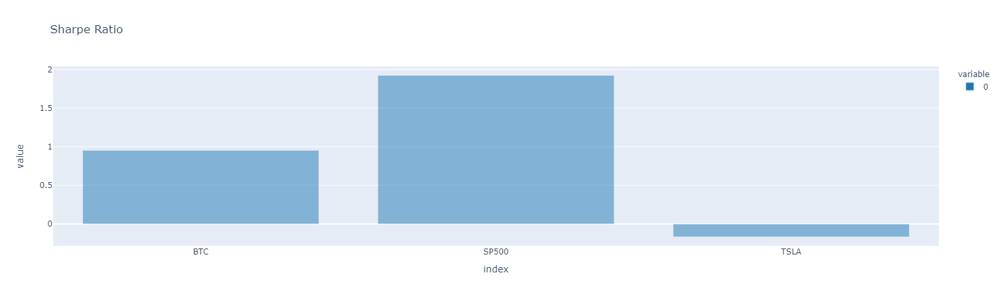

In [38]:
px.bar(
        sharpe_ratios_df,
        color_discrete_sequence=px.colors.qualitative.D3,
        opacity = 0.5,
        title="Sharpe Ratio"
    )

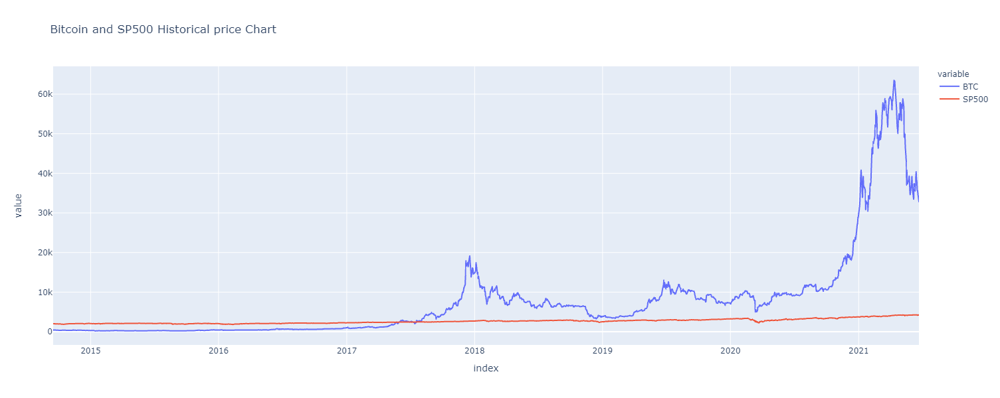

In [39]:
# SP500 
px.line(
        btc_sp500,
        height = 600,
        width = 1000,
        title = "Bitcoin and SP500 Historical price Chart"
    )

In [40]:
# Saved cleaned dataframes into local drive

btc.to_csv(r'C:\Users\tapas kumar roy\OneDrive\Desktop\class\project1\Resources\btc.csv', index = True)
sp500.to_csv(r'C:\Users\tapas kumar roy\OneDrive\Desktop\class\project1\Resources\sp500.csv', index = True)
btc_sp500.to_csv(r'C:\Users\tapas kumar roy\OneDrive\Desktop\class\project1\Resources\btc_sp500.csv', index = True)

In [41]:
btc_sp500.head()

,BTC,SP500
2014-09-16,457.334015,1998.979980
2014-09-17,424.440002,2001.569946
2014-09-18,394.795990,2011.359985
2014-09-19,408.903992,2010.400024
2014-09-22,435.790985,1994.290039


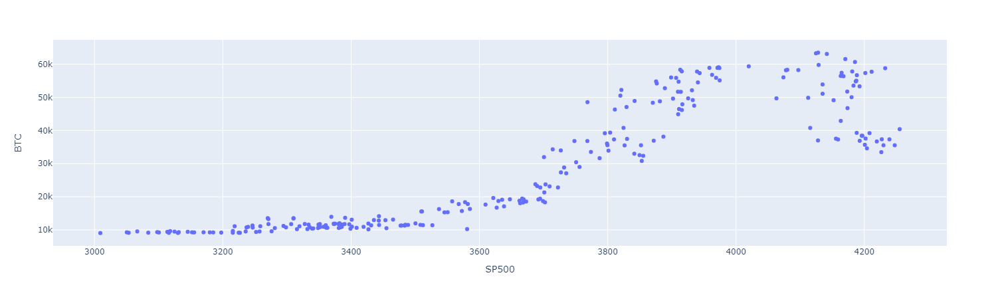

In [42]:
# Sctter plot between BTC and SP500

px.scatter(
    btc_sp500.loc['2020-06-14':'2021-06-14'],
    x="SP500",
    y="BTC"
)

In [43]:
# Display correlations

correlation_longterm = btc_sp500.loc['2014-09-14':'2020-12-01'].corr()
correlation_nearterm = btc_sp500.loc['2021-01-01':'2021-06-14'].corr()
print("***** LONGTERM CORRELATION *****")
print(correlation_longterm)
print()
print("***** SHORTTERM CORRELATION *****")
print(correlation_nearterm)
print()
print("CONCLUSION: BITCOIN IS BECOMING LESS CORRELATED WITH SP500 MAKING IN THE PAST 6 MONTHS")

***** LONGTERM CORRELATION *****
            BTC     SP500
BTC    1.000000  0.884074
SP500  0.884074  1.000000

***** SHORTTERM CORRELATION *****
            BTC     SP500
BTC    1.000000  0.258544
SP500  0.258544  1.000000

CONCLUSION: BITCOIN IS BECOMING LESS CORRELATED WITH SP500 MAKING IN THE PAST 6 MONTHS


In [44]:
# Rolling correlation

btc_sp500['BTC'].rolling(7).corr(btc_sp500['SP500'])

2014-09-16         NaN
2014-09-17         NaN
2014-09-18         NaN
2014-09-19         NaN
2014-09-22         NaN
                ...   
2021-06-15    0.576988
2021-06-16    0.390709
2021-06-17    0.500757
2021-06-18    0.553160
2021-06-22    0.219083
Length: 1698, dtype: float64

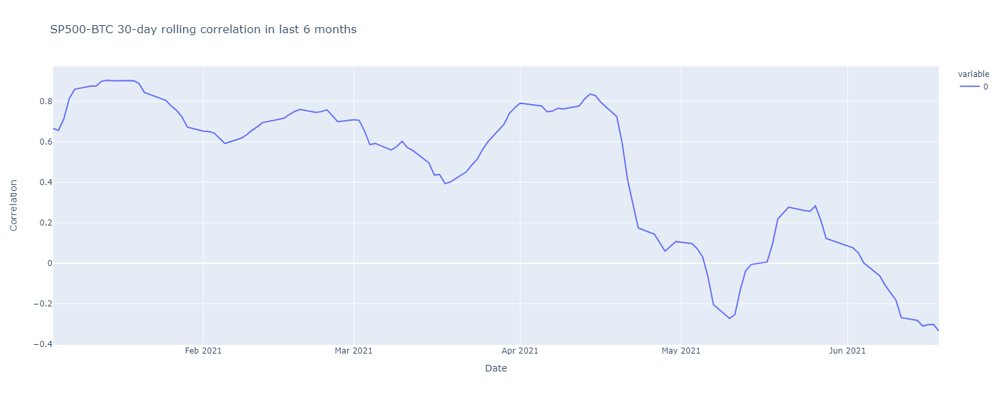

In [45]:
# Plot rolling correlation between BTC and SP500

px.line(
        btc_sp500['BTC'].rolling(30).corr(btc_sp500['SP500']).loc['2021-01-01':'2021-06-19'],
        height = 600,
        width = 1000,
        labels = {'index':'Date',
                  'value':'Correlation'},
        title = "SP500-BTC 30-day rolling correlation in last 6 months"
    )
# Rolling correlation is pretty random - not concrete correlation. 

In [46]:
# Get gold data

gold = quandl.get("BUNDESBANK/BBK01_WT5511")

In [47]:
btc_sp500_gold = pd.concat([btc_sp500,gold],axis='columns',join='inner')
btc_sp500_gold.rename(columns={'Value':'Gold'}, inplace=True)
btc_sp500.tail()

,BTC,SP500
2021-06-15,38347.062500,4246.589844
2021-06-16,38053.503906,4223.700195
2021-06-17,35787.246094,4221.859863
2021-06-18,35615.871094,4166.450195
2021-06-22,32852.609375,4247.859863


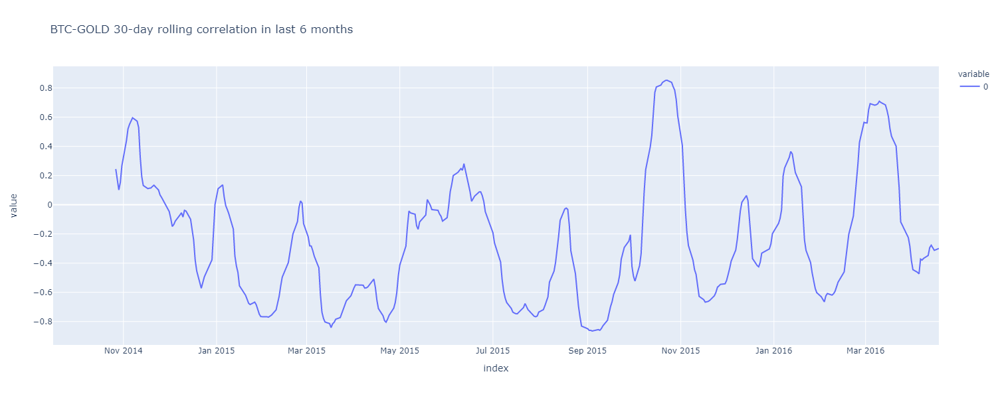

In [48]:
# Plot rolling correlation between BTC and Gold

px.line(
        btc_sp500_gold['BTC'].rolling(window=30).corr(btc_sp500_gold['Gold']),
        height = 600,
        width = 1000,
        #labels = {'index':'Date',
                  #'value':'Correlation'},
        title = "BTC-GOLD 30-day rolling correlation in last 6 months"
    )

In [49]:
# Copy bitcoin price data to master_df which will be used to concatenate wallet data, hashrate data and difficulty data

master_df = btc
master_df.head()

,BTC,7MA,20MA,50MA,200MA
2014-09-16,457.334015,NaN,NaN,NaN,NaN
2014-09-17,424.440002,NaN,NaN,NaN,NaN
2014-09-18,394.795990,NaN,NaN,NaN,NaN
2014-09-19,408.903992,NaN,NaN,NaN,NaN
2014-09-20,398.821014,NaN,NaN,NaN,NaN


In [50]:
# Get Wallet data from Quandl

btcwallet = quandl.get("BCHAIN/MWNUS", authtoken="9wWEFV28U5nJKzzLsrxq")
btcwallet = btcwallet.rename(columns = {'Value':'Wallet'})
btcwallet = btcwallet.loc["2014-09-16":"2021-06-15"]
btcwallet.index = btcwallet.index.date

btcwallet.index.is_unique
btcwallet.drop_duplicates(inplace=True)

In [51]:
btcwallet.head()

,Wallet
2014-09-16,2207905.0
2014-09-17,2212540.0
2014-09-18,2218905.0
2014-09-19,2222984.0
2014-09-20,2227543.0


In [52]:
# Get difficulty data from Quandl

btcdifficulty = quandl.get("BCHAIN/DIFF", authtoken="9wWEFV28U5nJKzzLsrxq")
btcdifficulty = btcdifficulty.rename(columns = {'Value':'Difficulty'})
btcdifficulty = btcdifficulty.loc["2014-09-16":"2021-06-15"]
btcdifficulty.index = btcdifficulty.index.date

btcdifficulty.index.is_unique
btcdifficulty.drop_duplicates(inplace=True)

btcdifficulty.head()

,Difficulty
2014-09-16,2.982973e+10
2014-09-17,2.982973e+10
2014-09-26,3.466143e+10
2014-09-28,3.466143e+10
2014-10-08,3.500248e+10


In [53]:
# Get hashrate data from Quandl - 

btchashrate = quandl.get("BCHAIN/HRATE", authtoken="9wWEFV28U5nJKzzLsrxq")
btchashrate = btchashrate.rename(columns = {'Value':'Hash Rate'})

startdate = pd.to_datetime('2021-05-01')
enddate = pd.to_datetime('2021-06-19')
btchashrate_slice = btchashrate.loc[startdate:enddate]
btchashrate_slice.index = btchashrate_slice.index.date

btchashrate_slice.index.is_unique
btchashrate_slice.drop_duplicates(inplace=True)

btchashrate_slice.head()

,Hash Rate
2021-05-01,1.589546e+08
2021-05-02,1.895272e+08
2021-05-03,1.813314e+08
2021-05-04,1.854293e+08
2021-05-05,1.608420e+08


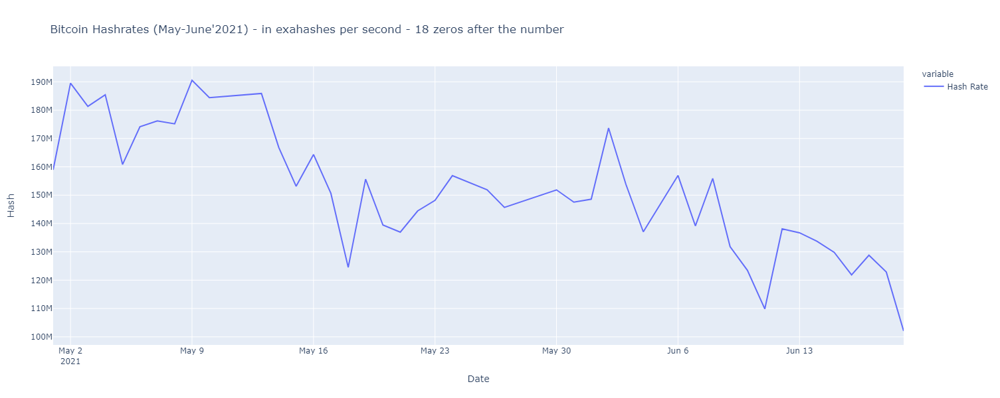

In [54]:
# Plot hashrate data 

px.line(
        btchashrate_slice, 
        height = 600,
        width = 970,
        labels ={'value':'Hash',
                'index':'Date'},
        title = "Bitcoin Hashrates (May-June'2021) - in exahashes per second - 18 zeros after the number"
       )

In [55]:
hash_diff = pd.concat([btchashrate,btcdifficulty],axis=1,join="inner")
hash_diff.head()

,Hash Rate,Difficulty
2014-09-16,250600.648941,2.982973e+10
2014-09-17,274326.154167,2.982973e+10
2014-09-26,220547.690039,3.466143e+10
2014-09-28,239501.007152,3.466143e+10
2014-10-08,247077.560330,3.500248e+10


In [56]:
hash_diff_zcores = hash_diff.apply(stats.zscore)

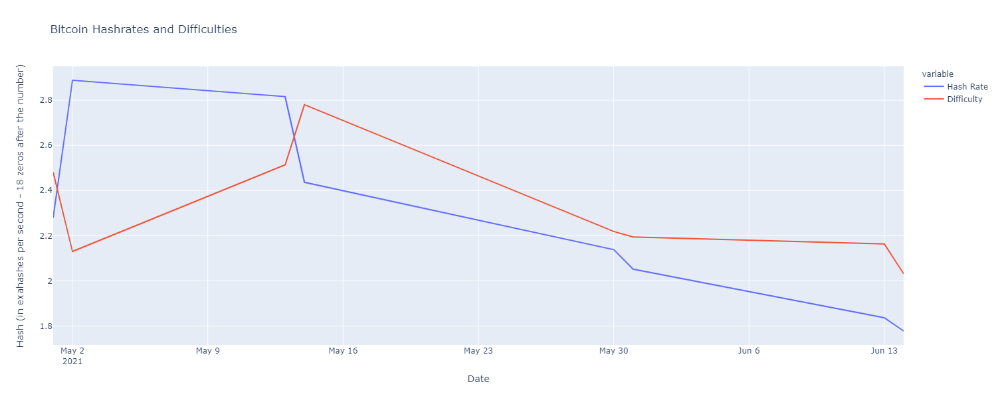

In [57]:
px.line(
        hash_diff_zcores.loc[startdate:enddate],
        height = 600,
        width = 970,
        labels ={'value':'Hash (in exahashes per second - 18 zeros after the number)',
                'index':'Date'},
        title = "Bitcoin Hashrates and Difficulties"
       )

In [58]:
# Concatenate data for bitcoin, wallet, hashrate and difficulty data

btc_concatenated = pd.concat([master_df,btcwallet,btcdifficulty,btchashrate],axis=1,join="inner")
btc_concatenated = btc_concatenated[['BTC','Wallet','Difficulty','Hash Rate']]
# standardize the data with z-scoe
btc_concat_zcores = btc_concatenated.apply(stats.zscore)

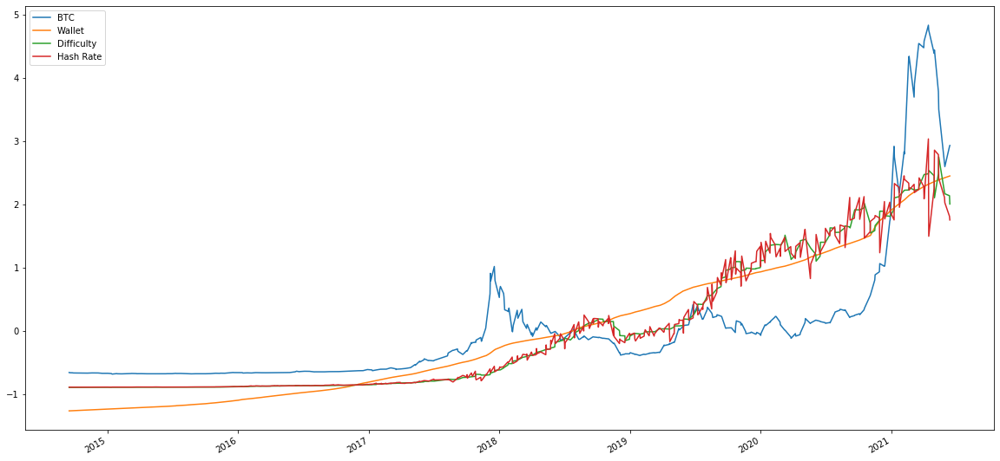

In [59]:
# Plot th concatenated data

btc_concat_zcores.plot(figsize=(20,10))

In [60]:
# Calculate correlation

btc_correlation = btc_concat_zcores.corr()
btc_correlation

,BTC,Wallet,Difficulty,Hash Rate
BTC,1.000000,0.764531,0.743536,0.738752
Wallet,0.764531,1.000000,0.967926,0.961511
Difficulty,0.743536,0.967926,1.000000,0.991599
Hash Rate,0.738752,0.961511,0.991599,1.000000


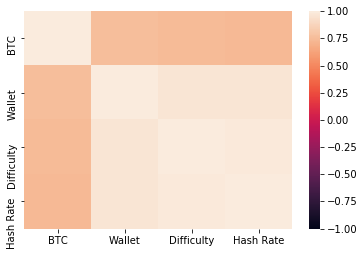

In [61]:
# Display correcations in a heatmap

sns.heatmap(btc_correlation, vmin=-1, vmax=1)